<a href="https://colab.research.google.com/github/elsioantunes/proc-video/blob/main/trabalhoT1b.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Processamento de video - Trabalho para o seminário da disciplina
## Integrantes: 
> Elsio Antunes  [RA 11097612]




<img width=400 src='https://github.com/elsioantunes/proc-video/blob/main/contrast.jpg?raw=true'>


## Objetivos:

1. Aplicar uma quantidade de conceitos de processamento de vídeo da disciplina.
 $\color{#DDDD00}{\text{em processo}}$
2.  Executar a aplicação com cenas pré-gravadas, para testes e gravação de “demo”. $\color{#DDDD00}{\text{em processo}}$
3.  Executar a aplicação com captura de vídeo em tempo real, mostrando na tela $\color{#dd0000}{\text{not ok}}$


# Tema do trabalho
O tema é a captura do estado de um cubo mágico. 
Dado um cubo mágico do tipo *rubik cube 3x3*, proceder a estração da posição das suas partes integrantes por intermédio da visualização das cores a partir de um video com a movimentação do objeto. 


# Cenário de aplicação
Uma das possibilidades seria a construção de um módulo de entrada (*picker*) para a utilização em um aplicativo para celulares que necessite da informação do estado do cubo para proceder a resolução (*solver*) do problema.

# Metodologia
Para fins de testes de implementaçãodo do protótipo do projeto, a partir da utilização da biblioteca OpenCV sobre a linguagem Python sobre o formato de documento Jupter Notebook sobre a plataforma Colab (Colabolatory Google Research), que me permite organizar em formato Rich Text, HTML ou LaTex, um documento para descrição do código em blocos, desenvolveremos os seguintes processos:

## Familiarização com a plataforma OpenCV
Exercícios, pesquisa, resolução de pequenos sub problemas e atenta leitura da documentação **OpenCV** são partes fundamentais para o desenvolvimento de projetos, dado que a plataforma é consolidada e de grande volume, cobrindo quase todos os algoritmos e assuntos relacionados a edição imagens e video.  

## Estudo de espaço de cores
Importante area da ciência, com ramos de interesse profissional e científico. Organizações específicas de cores e o funcionamento de dispositivos que permitem captura e reprodução de imagens demandam a atenção de quem almeja estudar e construir novas tecnologias.

## Representação e qualificação de imagens
Como visto nos laboratórios, em especial o LAB 4 que tratou sobre histogramas, o processamento de imagens abrange formas de medir, descrever, comparar, reconhecer critérios de ações, tanto para editar quanto para extrair informações e até ações que extrapolam o campo dos dispositivos de exibição. Por exemplo, a utilização de processamento de imagem em processos industriais. 

## Filtros e transformações
O principal processamento possível em imagens é a aplicação de filtros. Filtros para as mais diversas modificações na imagem original. Em especial a suavização e a retirada de ruídos da imagem são as principais técnicas, motivadas inicialmente pela melhoria da qualidade de imagem e posteriormente utilizadas como componente de outras transformações. Outros exemplos são a clusterização de cores e o reconhecimento de bordas, útil na compactação de imagens e videos, na exibição eficiente, na captura de movimentos e reconhecimento de objetos. 

## Abertura e Fechamento (Mathematical morphology)
Em nosso projeto, utilizamos as técnicas de abertura e fechamento. Conceitos da **teoria dos conjuntos** e **topologia** que consistem em considerar as bordas de áreas e, a partir de uma aplicação de um filtro com kernel específico, retirar ou acrescentar, diminuir ou aumentar esta borda. Com efeito, podemos 'fechar buracos' e/ou eliminar pequenas areas consideradas ruído e assim definir melhores contornos e conjuntos de interesse. 

<center><img width=180 src='https://upload.wikimedia.org/wikipedia/commons/f/fc/DilationErosion.png'></center>


## Segmentação de cores
Apartir do estudo do espaço de cores e de uma pesquisa dos limites da variação dos valores no caso concreto é possivel delimitar as areas de interesse de uma imagem utilizando uma máscara. E então, utilizando uma operação *bit a bit* da máscara com a imagem original obtém-se o objeto capturado.  


## Resultados preliminares
Abaixo o *link* para o video dos resultados preliminares e o link para o código em Python do processamento dos frames de um video de entrada. 

<IMG src='https://github.com/elsioantunes/proc-video/blob/main/cubo1.png?raw=true'><br><IMG src='https://github.com/elsioantunes/proc-video/blob/main/cubo2.png?raw=true'><br><IMG src='https://github.com/elsioantunes/proc-video/blob/main/cubo3
.png?raw=true'>


https://github.com/elsioantunes/proc-video/blob/main/testeRubik4.mp4


Página do github: https://elsioantunes.github.io/proc-video/




##Open image

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


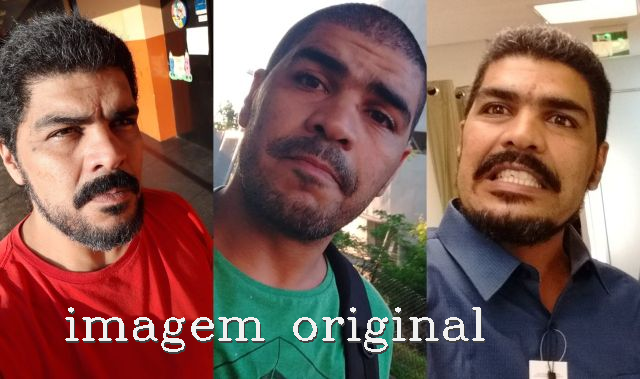

height:  379 width:  640 channels:  3


In [ ]:
import numpy as np
import random as rnd
import cv2 as cv
from base64 import b64encode
from google.colab.patches import cv2_imshow
from google.colab import drive
from IPython.display import HTML
 
#https://docs.opencv.org/4.5.2/d6/d6e/group__imgproc__draw.html
 
drive.mount('/content/drive')
img = cv.imread('/content/drive/MyDrive/((UFABC))/(proc video)/elsios.jpg')
height, width, channels = img.shape
 
myBgColor = (255, 245, 245)
gray = (128, 128, 128)

def openVideo(url):
    cap = cv.VideoCapture(url)
    ret, frame = cap.read()
    vheight, vwidth = frame.shape[:2]
    fps = cap.get(cv.CAP_PROP_FPS)
    print("frame count:", cap.get(cv.CAP_PROP_FRAME_COUNT))
    print("width, height, fps:", vwidth, vheight, fps)
    return cap

def newVideo(outUrl, frame):
    fourcc = cv.VideoWriter_fourcc(*'VP80')
    vheight, vwidth = frame.shape[:2]
    return cv.VideoWriter(outUrl, fourcc, 25, (vwidth, vheight))


def putCenter(img, cont):
    M = cv.moments(cont)
    x = int(M['m10']/M['m00'])
    y = int(M['m01']/M['m00'])
    cv.circle(img, (x,y), 8, (0,0,255), 2)

def overlayAlpha(img1, img2, alpha):
    return cv.addWeighted(img1, alpha, img2, 1-alpha, 0)

def rndColor():
    r = rnd.randrange(50, 240)
    g = rnd.randrange(50, 240)
    b = rnd.randrange(50, 240)
    return (r, g, b)

def newEmptyImg(w=width, h=height, corRGB=myBgColor):
    b, g, r = corRGB
    emptyImg = np.zeros((h, w, 3), np.uint8)
    emptyImg[:, :] = (r, g, b)
    return emptyImg
 
def overlay(bg, img, x, y):
    h, w, _ = img.shape
    bg[y:h + y, x:w + x] = img
    return bg
 
def tableShow(m):
    hl, wl, h, w, _ = np.array(m).shape
    bg = newEmptyImg(w*wl + 5*wl+5, h*hl + 5*hl+5, myBgColor)
    for i, lin in enumerate(m):
        for j, col in enumerate(lin):
            bg = overlay(bg, col, 5 + (5 + width) * j, 5 + (5 + height) * i)
    return bg
 
def text(img, txt, w = int(width/10), h = int(9*height/10)):
    imgtmp = img.copy()
    cv.putText(imgtmp, txt, (w, h), cv.FONT_HERSHEY_COMPLEX, 1.5, (64, 64, 64), 2)
    cv.putText(imgtmp, txt, (w-1, h-2), cv.FONT_HERSHEY_COMPLEX, 1.5, (240, 240, 240), 2)
    return imgtmp
 
def show(img, title=""):
    return cv2_imshow(text(img, title))
 
nullSrc = newEmptyImg()
 
show(img, "imagem original")
print("height: ", height, "width: ", width, "channels: ", channels)

# Abordagem 2 - Contornos

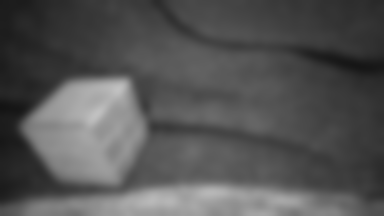

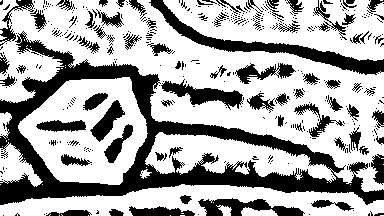

1221


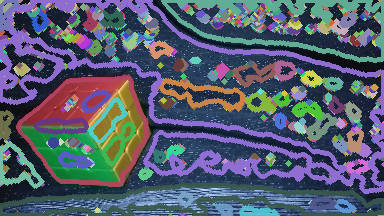

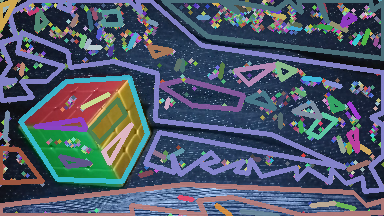

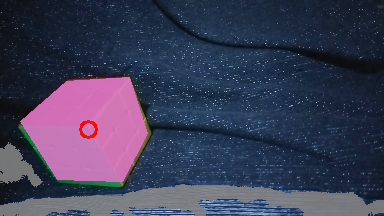

In [ ]:
def contornoConvexo2(img, debug=False):
    _, _, img2 = cv.split(cv.cvtColor(img, cv.COLOR_BGR2HSV))
    img2 = cv.GaussianBlur(img2, (25, 25), 0)
    if debug: show(img2)


    '''
    img2 = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    img2 = cv.GaussianBlur(img2, (25, 25), 0)
    if debug: show(img2)

    for i in range(10):
        img2a = cv.Canny(img2, 0, 20, 13+i*5)
        if debug: show(img2a)

    for i in range(10):
        _, img2a = cv.threshold(img2, 60, 60+i*2, cv.THRESH_BINARY)
        if debug: 
            print(i*10)
            show(img2a)
    '''

    img2 = cv.adaptiveThreshold(img2, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 25, 1)
    if debug: show(img2)

    #img2 = cv.inRange(hsv, np.array([0, 0, 97]), np.array([255, 255, 255]))
    #if debug: show(img2)

    contours, _ = cv.findContours(img2, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
    if debug: 
        img3 = img.copy()
        for i, cont in enumerate(contours):
            cv.drawContours(img3, [cont] , 0, rndColor(), 3)
        img3 = overlayAlpha(img, img3, .1)
        print(len(contours))
        show(img3)

    eps = 8
    if debug: 
        img3 = img.copy()
        for i, cont in enumerate(contours):
            aprox = cv.approxPolyDP(cont, eps, True)
            cv.drawContours(img3, [aprox] , 0, rndColor(), 3)
        img3 = overlayAlpha(img, img3, .1)
        show(img3)


    img3 = img.copy()
    for i, cont in enumerate(contours):
        aprox = cv.approxPolyDP(cont, eps, True)
        aprox2 = cv.approxPolyDP(cont, eps+10, True)
        if cv.isContourConvex(aprox2):
            if cv.contourArea(aprox) > 8000:    
                cv.drawContours(img3, [aprox] , 0, rndColor(), cv.FILLED) 
                putCenter(img3, aprox)
            else:
                cv.drawContours(img3, [cont] , 0, gray, cv.FILLED) 
    img3 = overlayAlpha(img, img3, .1)
    if debug: show(img3)

    return img3

img3 = cv.imread('/content/drive/MyDrive/((UFABC))/(proc video)/cubo.png')
img3 = contornoConvexo2(img3, True)

Várias tentativas de combinações de filtros para enfatizar as características (features) de um cubo (ainda) estão sendo testadas

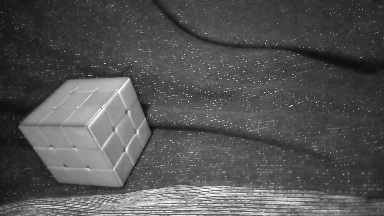

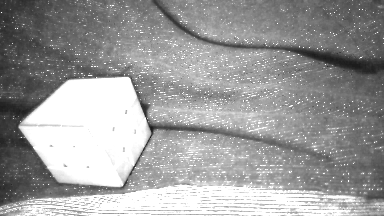

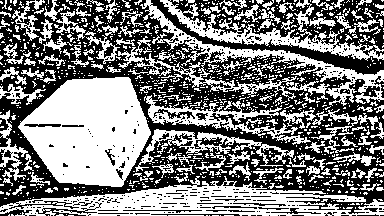

1716


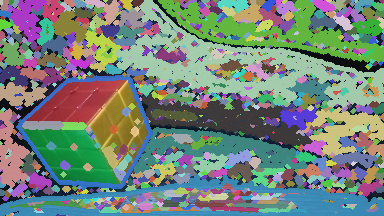

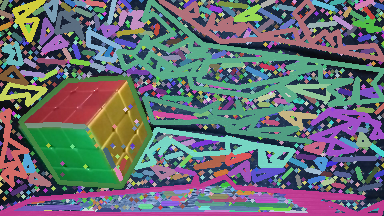

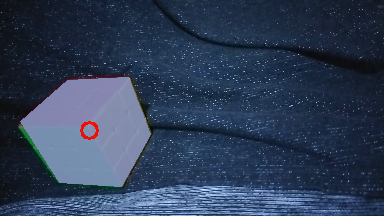

In [ ]:
def contornoConvexo2(img, debug=False):
    _, _, img2 = cv.split(cv.cvtColor(img, cv.COLOR_BGR2HSV))
    #img2 = cv.medianBlur(img2, 9)
    if debug: show(img2)

    img2 = cv.add(img2, img2)
    if debug: show(img2)

    img2 = cv.adaptiveThreshold(img2, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 25, 1)
    if debug: show(img2)

    #img2 = cv.inRange(hsv, np.array([0, 0, 97]), np.array([255, 255, 255]))
    #if debug: show(img2)

    contours, _ = cv.findContours(img2, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
    if debug: 
        img3 = img.copy()
        for i, cont in enumerate(contours):
            cv.drawContours(img3, [cont] , 0, rndColor(), 3)
        img3 = overlayAlpha(img, img3, .1)
        print(len(contours))
        show(img3)

    eps = 8
    if debug: 
        img3 = img.copy()
        for i, cont in enumerate(contours):
            aprox = cv.approxPolyDP(cont, eps, True)
            cv.drawContours(img3, [aprox] , 0, rndColor(), 3)
        img3 = overlayAlpha(img, img3, .1)
        show(img3)


    img3 = img.copy()
    for i, cont in enumerate(contours):
        aprox = cv.approxPolyDP(cont, eps, True)
        aprox2 = cv.approxPolyDP(cont, eps+10, True)
        if cv.isContourConvex(aprox2):
            if cv.contourArea(aprox) > 8000:    
                cv.drawContours(img3, [aprox] , 0, rndColor(), cv.FILLED) 
                putCenter(img3, aprox)
            else:
                cv.drawContours(img3, [cont] , 0, gray, cv.FILLED) 
    img3 = overlayAlpha(img, img3, .1)
    if debug: show(img3)

    return img3

img3 = cv.imread('/content/drive/MyDrive/((UFABC))/(proc video)/cubo.png')
img3 = contornoConvexo2(img3, True)

## Video2 (contorno convexo)


frame count: 272.0
width, height, fps: 1920 1080 29.58401109883815
frame:0


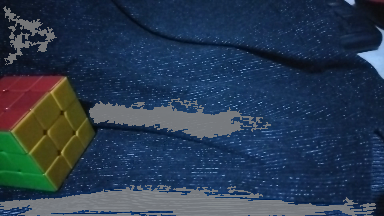

frame:1


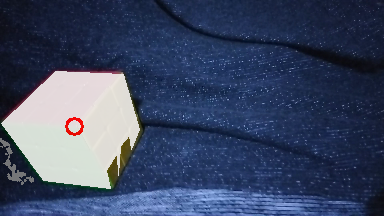

frame:2


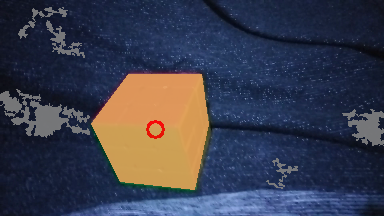

frame:3


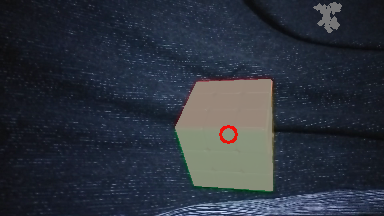

frame:4


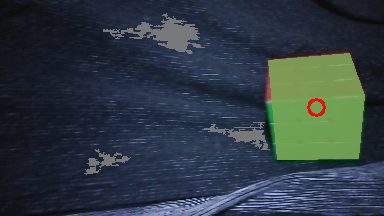

frame:5


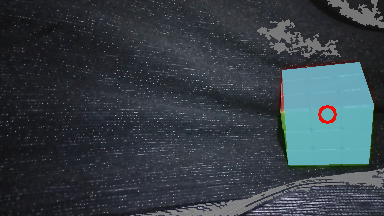

frame:6


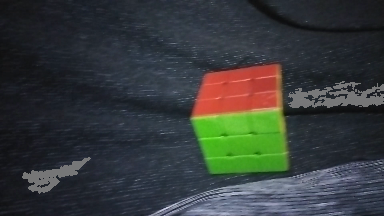

frame:7


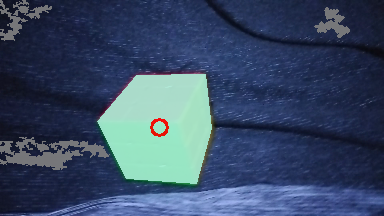

frame:8


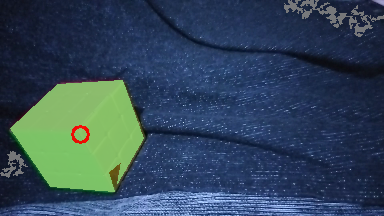

frame:9


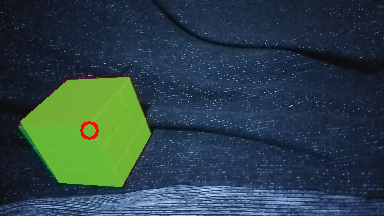

In [ ]:
inUrl = '/content/drive/MyDrive/((UFABC))/(proc video)/rubik4.mp4'
outUrl = '/content/drive/MyDrive/((UFABC))/(proc video)/teste.webm'
saida = None
 
x = 0
i = 0
frames = []
cap = openVideo(inUrl)

while True:
    ret, atualFrame = cap.read()
    if ret: 
        #atualFrame = process(atualFrame)
        atualFrame = cv.resize(atualFrame, (384, 216))
        atualFrame = contornoConvexo2(atualFrame)
        
        if saida == None: 
            saida = newVideo(outUrl, atualFrame)
        saida.write(atualFrame)

        if (x % 30) == 0:
            print (f"frame:{i}")
            frames.append(atualFrame)
            show(atualFrame) 
            i = i + 1
        x = x + 1
    else: break

cap.release()
saida.release()

In [ ]:
video = open(outUrl, 'rb').read()
vidDec = "data:video/mp4;base64," + b64encode(video).decode()
HTML(f'<video width=384 controls><source src= "{vidDec}" type="video/mp4"></video>')

# REFERÊNCIAS


*   Color spaces in OpenCV (C++ / Python) <BR>
https://learnopencv.com/color-spaces-in-opencv-cpp-python/

*   Morphological Transformations (OpenCV doc) <br>
https://docs.opencv.org/4.5.2/d9/d61/tutorial_py_morphological_ops.html
    
* OpenCV Object Detection Using Color segmentation (video) <br>
https://www.youtube.com/watch?v=efWITgemKvs


* Mathematical morphology <br>
https://en.wikipedia.org/wiki/Mathematical_morphology


* recognise colours in 3x3 grid<br>
https://answers.opencv.org/question/70958/recognise-colours-in-3x3-grid/



